In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Enter Your API") # Enter your api key 
project = rf.workspace("diameteridentifier").project("defect_detection-b5ove")
version = project.version(1)
dataset = version.download("yolov8-obb")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.0 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.8
    Uninstalling idna-3.8:
      Successfully uninstalled idna-3.8
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Defect_Detection-1 in yolov8-obb:: 100%|██████████| 732/732 [00:00<00:00, 6801.54it/s]


In [3]:
!pip install ultralytics

from IPython import display
display.clear_output()
from ultralytics import YOLO

from IPython.display import display, Image

In [4]:
!nvidia-smi

Thu Sep 12 11:33:07 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P8              13W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [5]:
!yolo task=detect mode=train model=yolov8x.pt data= /content/Defect_Detection-1/data.yaml epochs=250 imgsz=640 plots=True

100% 131M/131M [00:00<00:00, 355MB/s]
Ultralytics YOLOv8.2.92 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/content/Defect_Detection-1/data.yaml, epochs=250, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_c

In [6]:
import shutil
src = '/content/runs'
des = '/content/drive/MyDrive/Object_detections/defect_detections/model'
shutil.copytree(src, des)

'/content/drive/MyDrive/Object_detections/defect_detections/model'

In [3]:
import os
path = r'D:\Prakash\Github\Object-Detection-And-Diameter-Measurement-Using-YoloV8\Object-Detection-And-Diameter-Measurement-Using-YoloV8\defect_detections\runs\detect\train'
images =[img for img in os.listdir(path) if img.endswith('.jpg') or img.endswith('.png')]
images

['confusion_matrix.png',
 'confusion_matrix_normalized.png',
 'F1_curve.png',
 'labels.jpg',
 'labels_correlogram.jpg',
 'PR_curve.png',
 'P_curve.png',
 'results.png',
 'R_curve.png',
 'train_batch0.jpg',
 'train_batch1.jpg',
 'train_batch2.jpg',
 'train_batch4800.jpg',
 'train_batch4801.jpg',
 'train_batch4802.jpg',
 'val_batch0_labels.jpg',
 'val_batch0_pred.jpg']

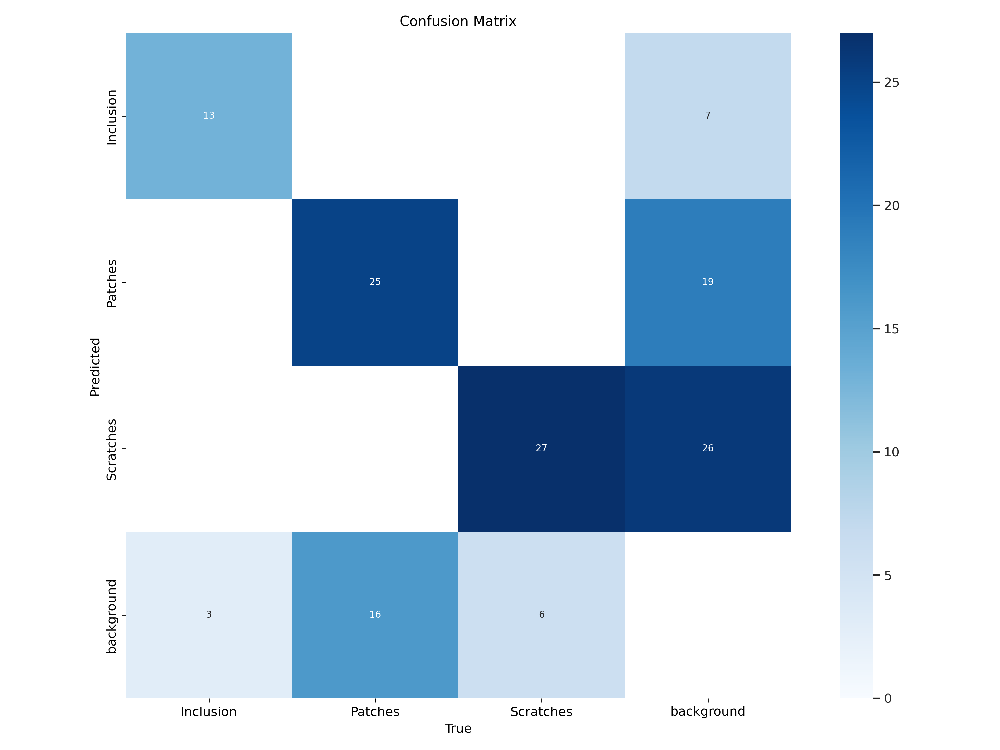

In [5]:
Image(filename= os.path.join(path, images[0]), width=600)

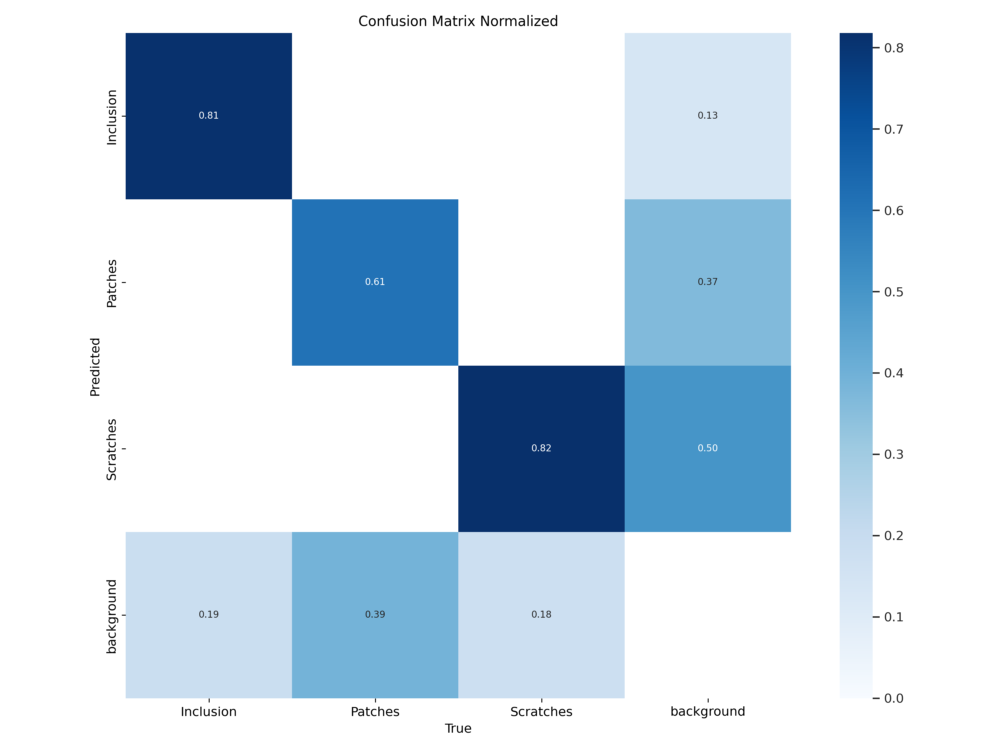

In [6]:
Image(filename= os.path.join(path, images[1]), width=600)

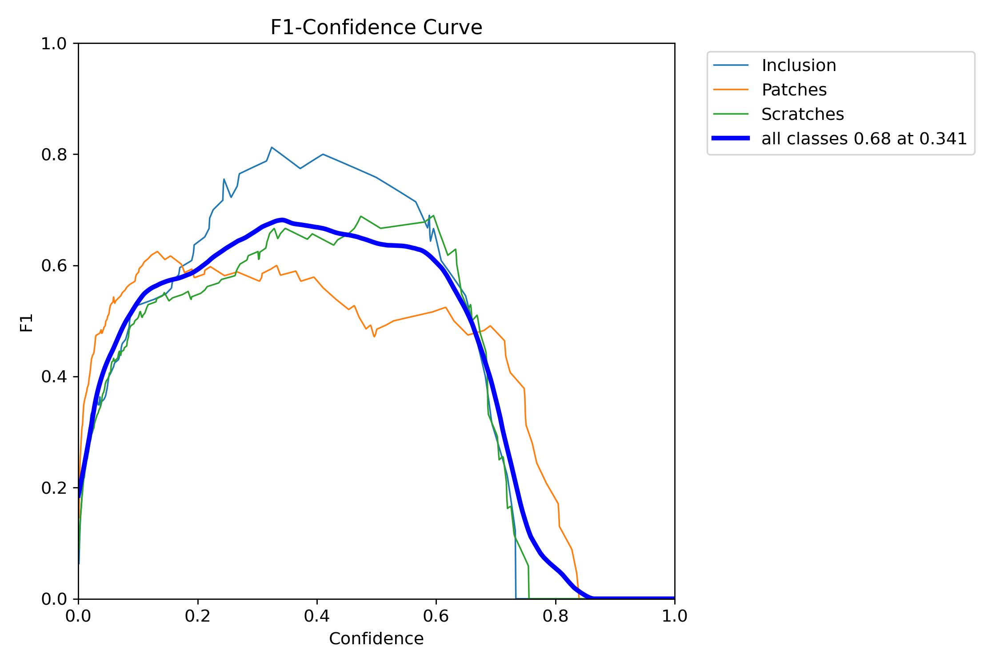

In [7]:
Image(filename= os.path.join(path, images[2]), width=600)

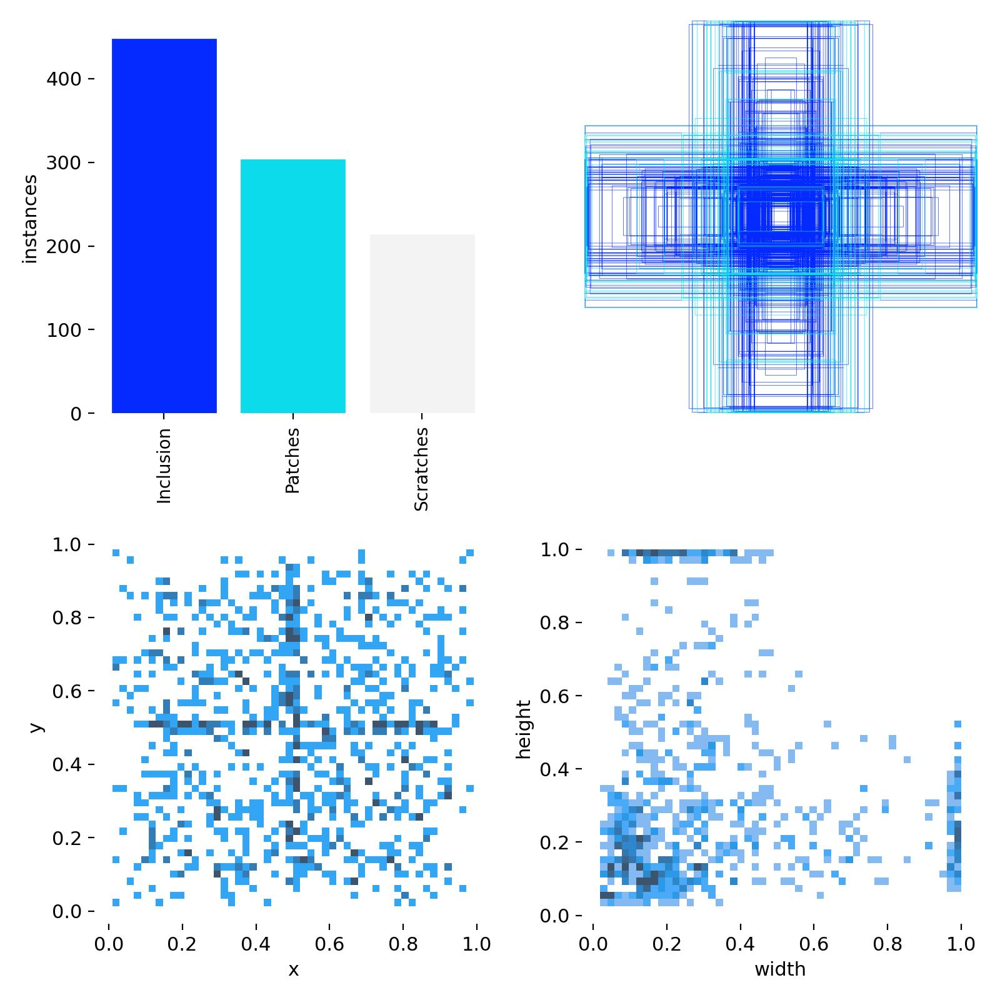

In [8]:
Image(filename= os.path.join(path, images[3]), width=600)

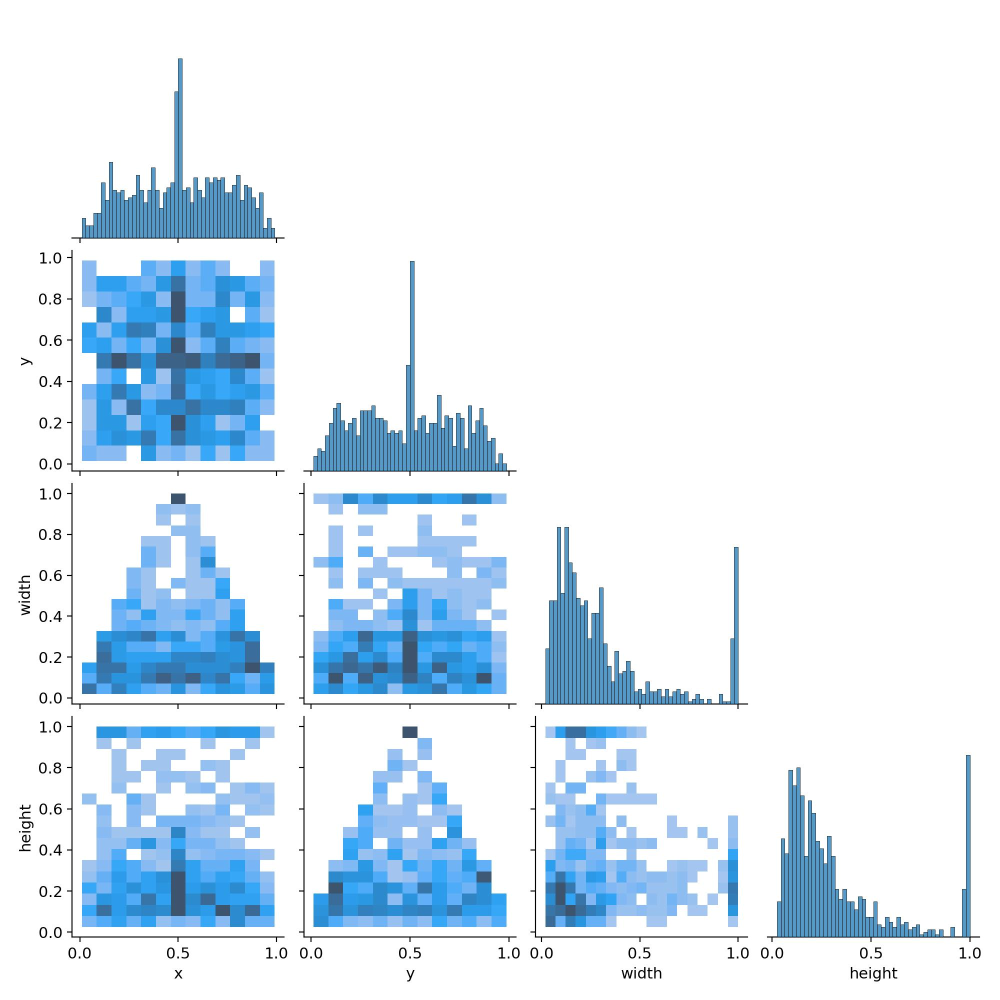

In [9]:
Image(filename= os.path.join(path, images[4]), width=600)

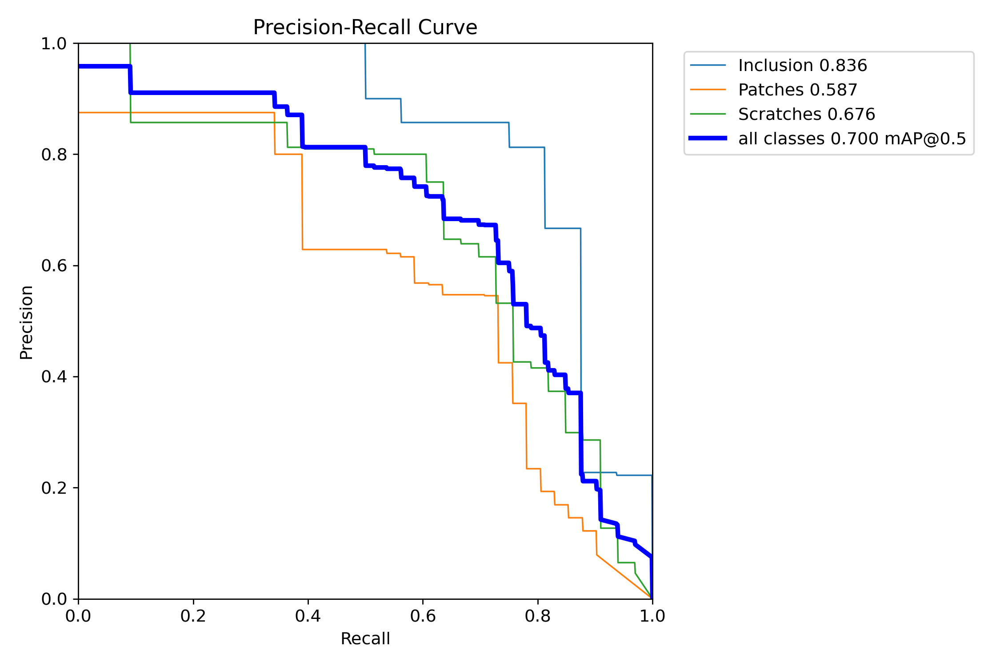

In [10]:
Image(filename= os.path.join(path, images[5]), width=600)

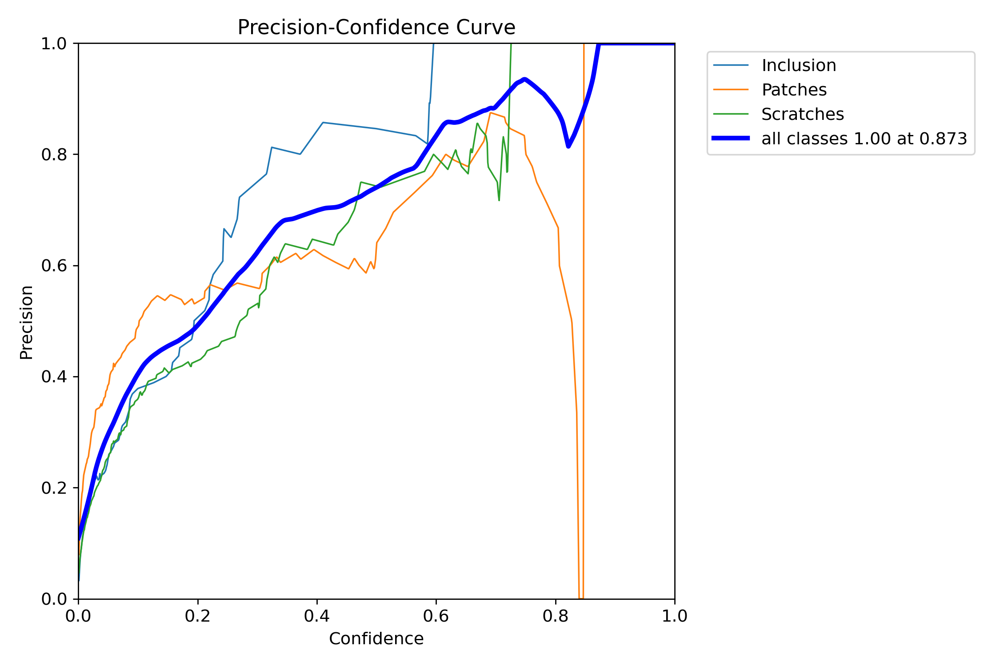

In [11]:
Image(filename= os.path.join(path, images[6]), width=600)

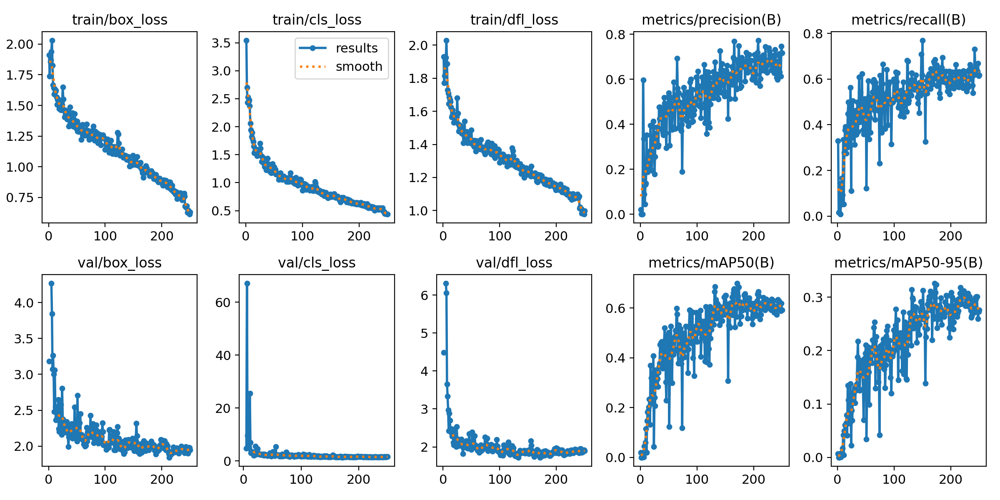

In [12]:
Image(filename= os.path.join(path, images[7]), width=600)

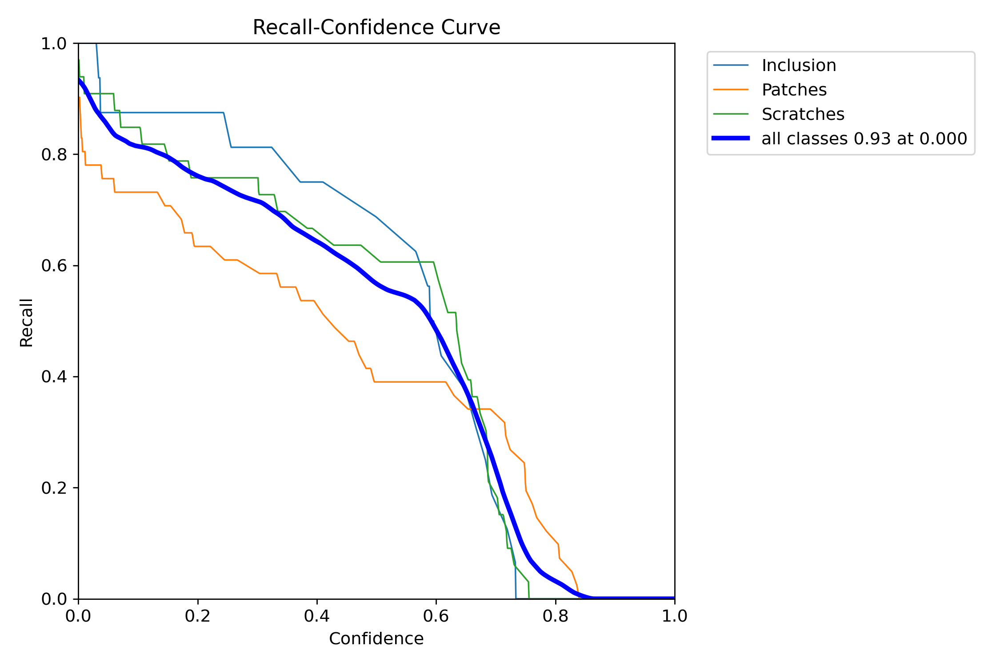

In [13]:
Image(filename= os.path.join(path, images[8]), width=600)

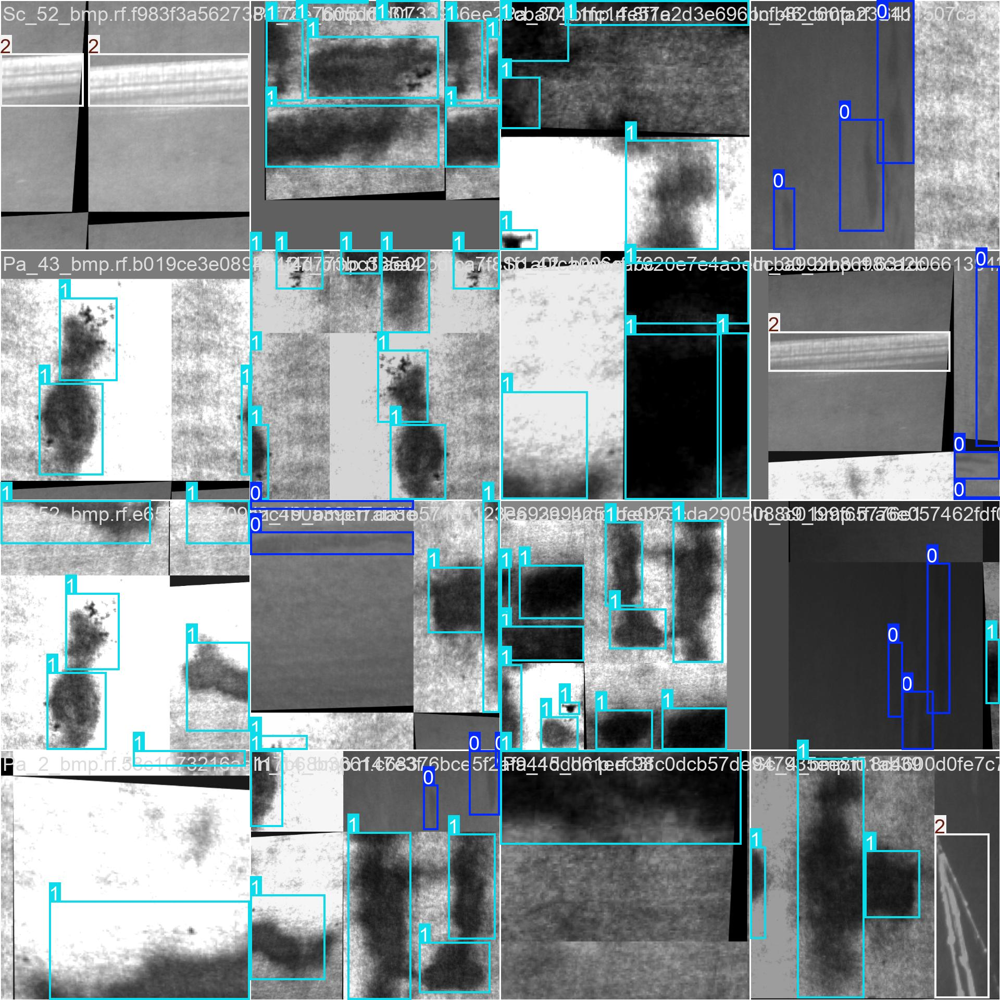

In [15]:
Image(filename= os.path.join(path, images[10]), width=600)

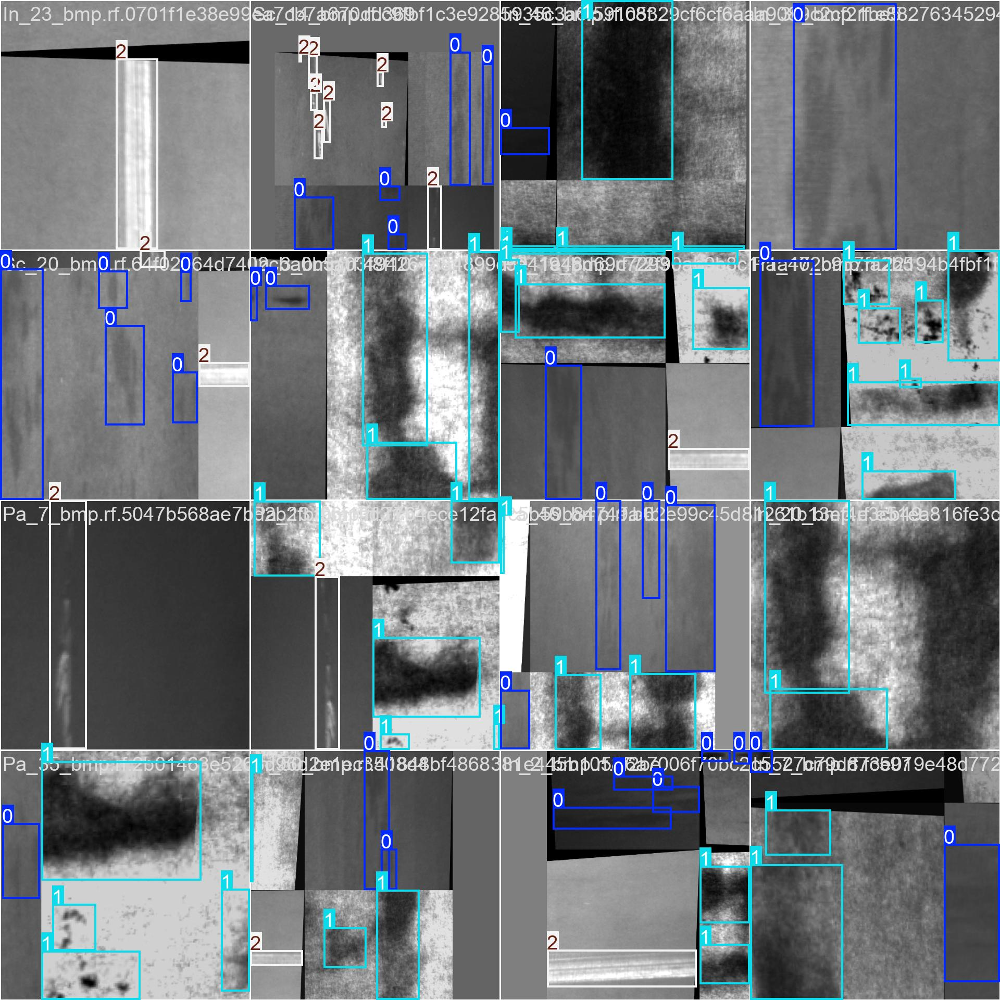

In [16]:
Image(filename= os.path.join(path, images[11]), width=600)

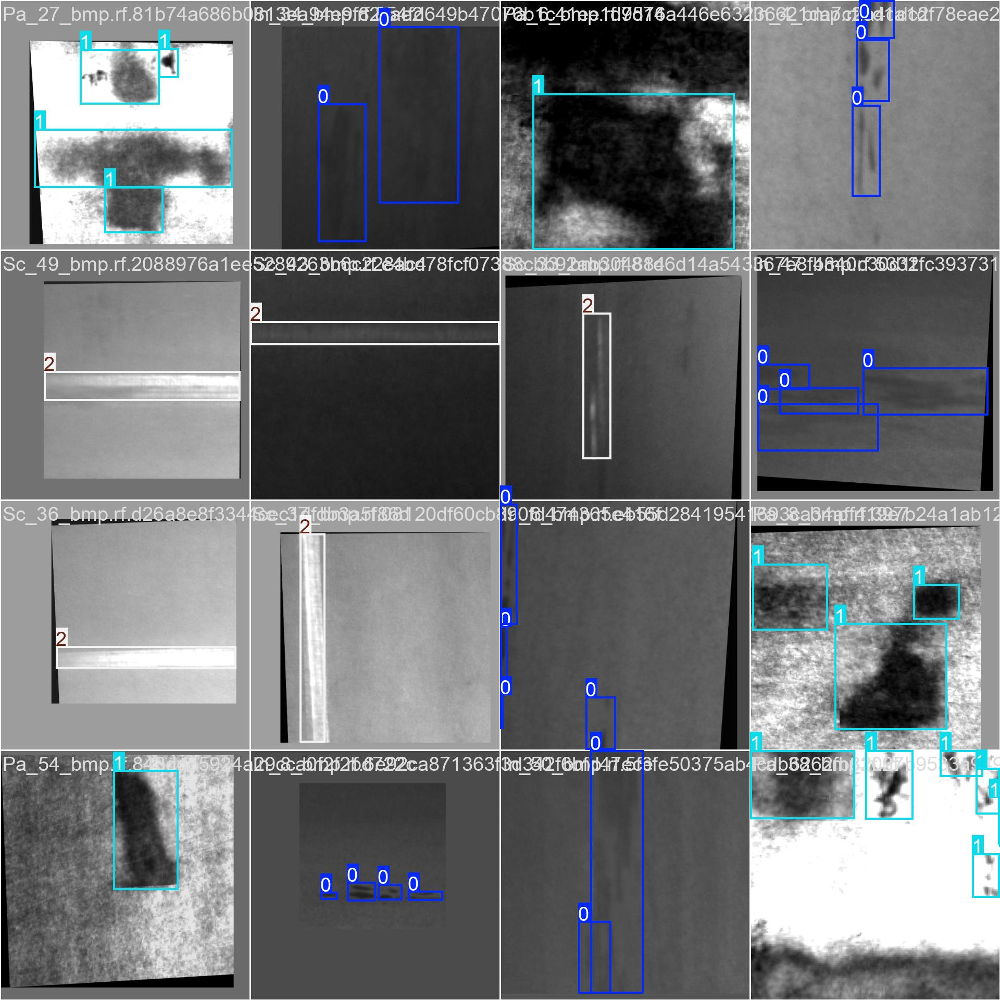

In [17]:
Image(filename= os.path.join(path, images[12]), width=600)

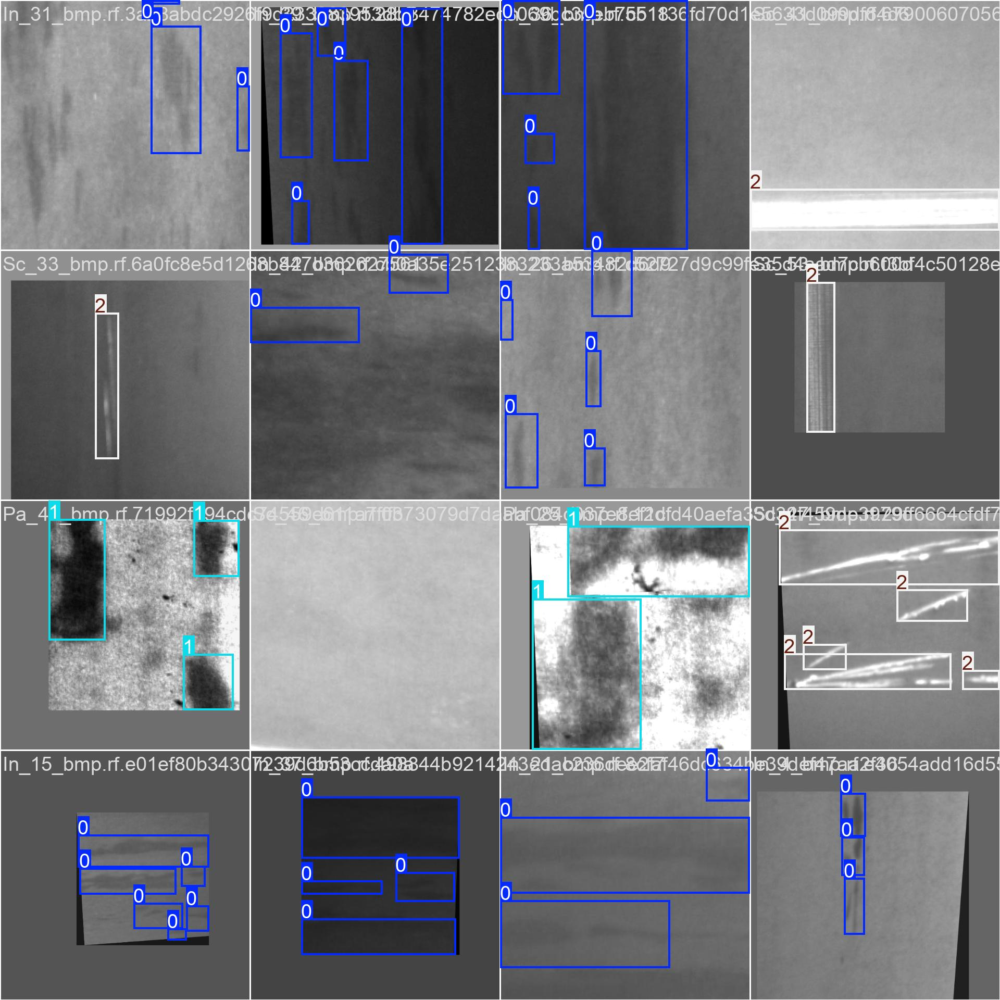

In [18]:
Image(filename= os.path.join(path, images[13]), width=600)

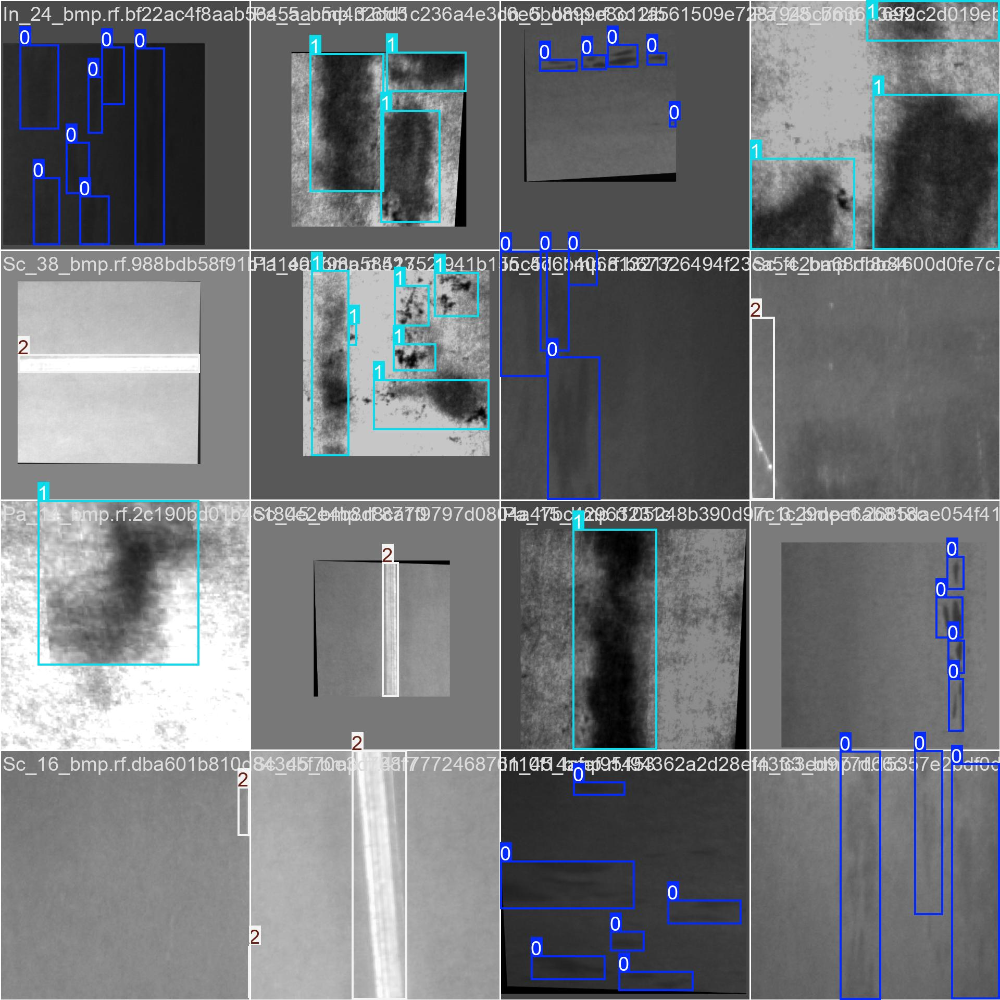

In [19]:
Image(filename= os.path.join(path, images[14]), width=600)

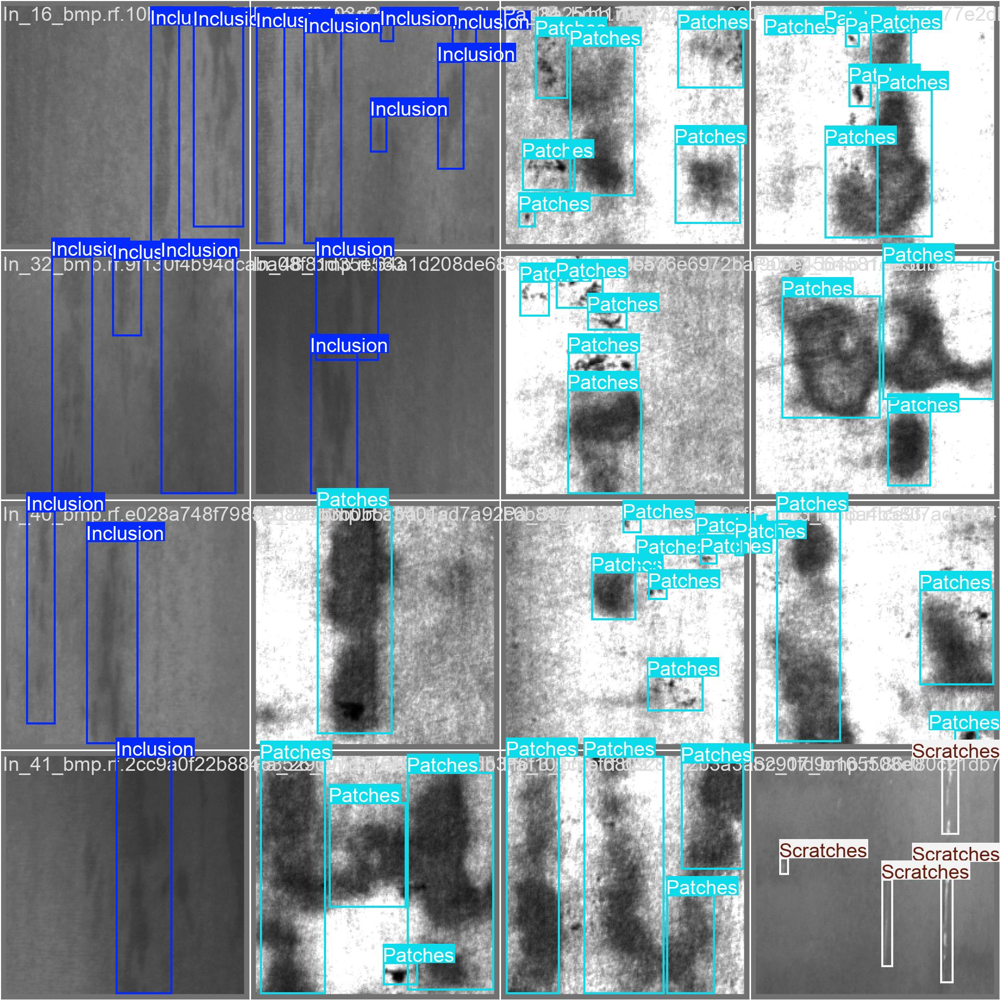

In [20]:
Image(filename= os.path.join(path, images[15]), width=600)

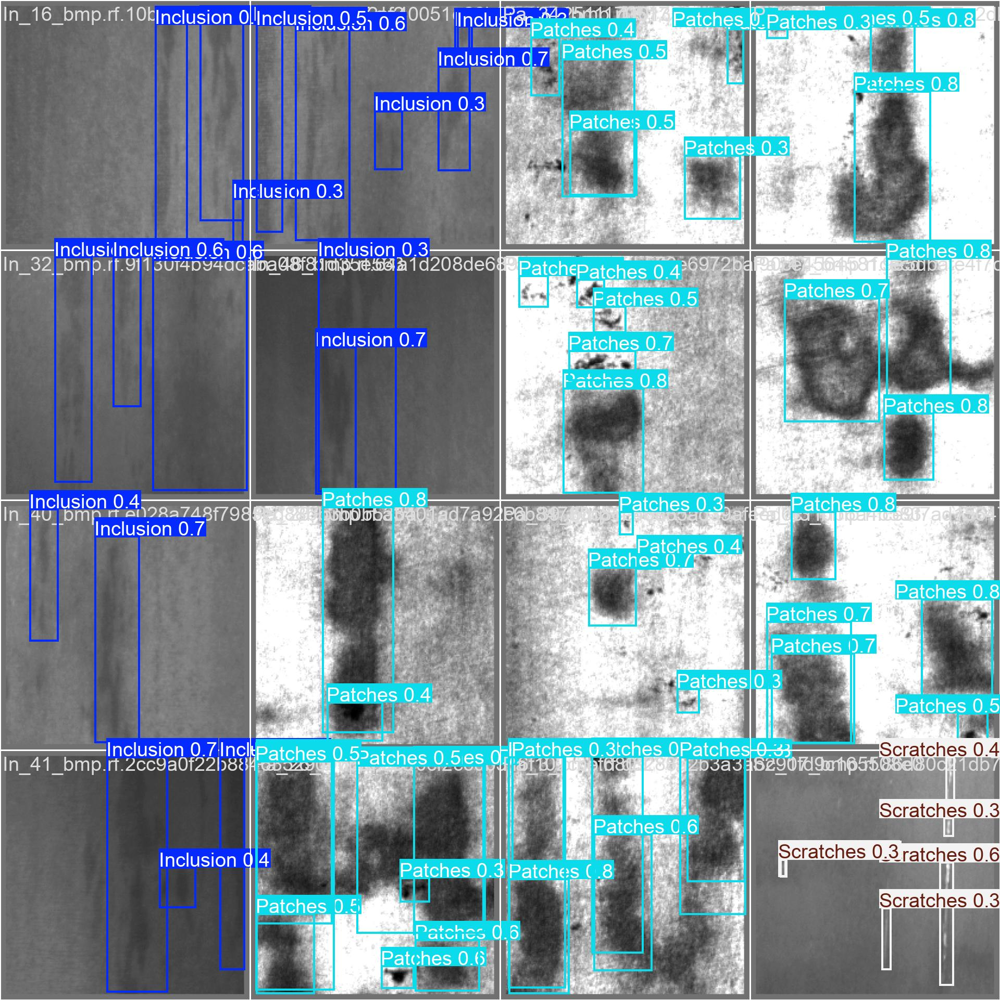

In [21]:
Image(filename= os.path.join(path, images[16]), width=600)

# Validation

In [23]:
def extract_predictions(results, confidence_threshold=0.1):
    predictions = []
    result = results[0].cpu()

    boxes = result.boxes.xywh.cpu().numpy()
    class_ids = result.boxes.cls.cpu().numpy()
    confidences = result.boxes.conf.cpu().numpy()
    names = result.names

    for i in range(len(boxes)):
        if confidences[i] >= confidence_threshold:  # Apply the confidence threshold
            prediction = {
                'x': boxes[i][0],
                'y': boxes[i][1],
                'width': boxes[i][2],
                'height': boxes[i][3],
                'confidence': confidences[i],
                'class': names[int(class_ids[i])],
                'class_id': int(class_ids[i])
            }
            predictions.append(prediction)

    return {'predictions': predictions}


In [31]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO


def process_frame(frame, predictions):
    # pred_diameter_mm_wi, pred_diameter_mm_wi, pred_diameter_mm_wi, pred_diameter_mm_wi = None, None, None, None
    for pred in predictions:
        x, y, width, height = int(pred['x']), int(pred['y']), int(pred['width']), int(pred['height'])
        class_name = pred['class']
        confidence = pred['confidence']
        # if class_name == 'Outer-Circle':
        #     pass
        # else:
            # Calculate the coordinates for the bounding box
        start_point = (x - width // 2, y - height // 2)
        end_point = (x + width // 2, y + height // 2)
        
        # Draw the bounding box
        cv2.rectangle(frame, start_point, end_point, (0, 255, 0), 1)
        
        # Create the label with class name and confidence
        # label = f"{class_name}: {confidence:.2f}"
        
        # # Put the label above the bounding box
        # label_size, _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)
        # label_y_min = max(start_point[1], label_size[1] + 10)
    return frame

In [29]:
def pred(img_path):
    img= cv2.imread(img_path)
    result = model_250(img)
    predictions = extract_predictions(result)
    print(predictions)
    frame_ = process_frame(img, predictions['predictions'])
    plt.imshow(frame_)
    plt.show()

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_1.bmp

0: 640x640 1 Patches, 83.6ms
Speed: 6.0ms preprocess, 83.6ms inference, 145.2ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 72.83478, 'y': 107.139015, 'width': 74.99228, 'height': 185.72197, 'confidence': 0.6048996, 'class': 'Patches', 'class_id': 1}]}


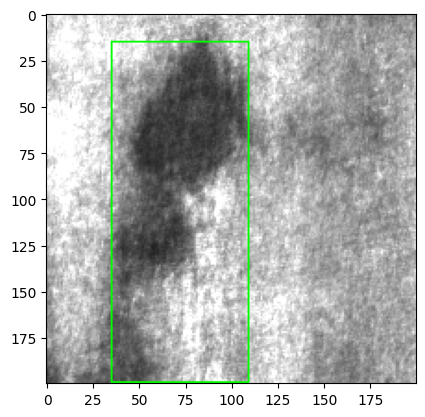

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_10.bmp

0: 640x640 1 Patches, 95.0ms
Speed: 7.0ms preprocess, 95.0ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 148.22974, 'y': 68.536, 'width': 62.980537, 'height': 136.48451, 'confidence': 0.7879055, 'class': 'Patches', 'class_id': 1}]}


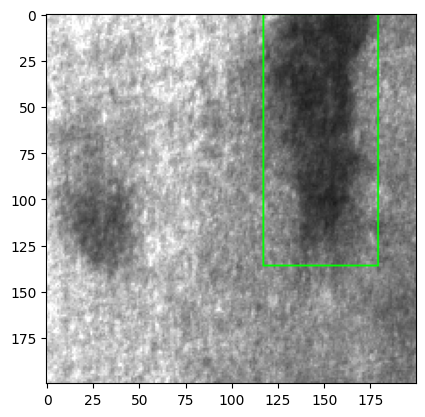

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_100.bmp

0: 640x640 4 Patchess, 87.8ms
Speed: 8.6ms preprocess, 87.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 134.77252, 'y': 67.28161, 'width': 55.679367, 'height': 134.28883, 'confidence': 0.66178584, 'class': 'Patches', 'class_id': 1}, {'x': 136.76219, 'y': 95.62996, 'width': 58.55429, 'height': 190.64209, 'confidence': 0.6340424, 'class': 'Patches', 'class_id': 1}, {'x': 143.37389, 'y': 157.01959, 'width': 49.53067, 'height': 75.34004, 'confidence': 0.6269884, 'class': 'Patches', 'class_id': 1}, {'x': 10.650114, 'y': 105.266624, 'width': 21.07383, 'height': 70.26024, 'confidence': 0.5212265, 'class': 'Patches', 'class_id': 1}]}


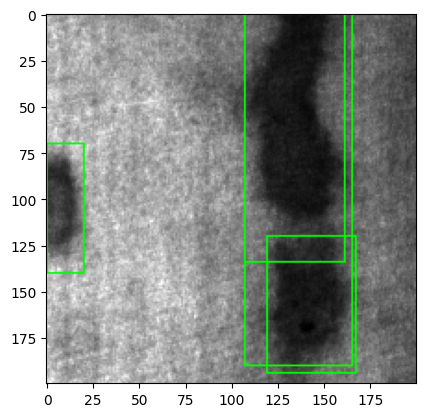

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_101.bmp

0: 640x640 3 Patchess, 83.4ms
Speed: 6.5ms preprocess, 83.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 52.501476, 'y': 47.435825, 'width': 56.4822, 'height': 94.41433, 'confidence': 0.8007257, 'class': 'Patches', 'class_id': 1}, {'x': 150.51802, 'y': 99.66669, 'width': 57.77191, 'height': 198.11887, 'confidence': 0.6374768, 'class': 'Patches', 'class_id': 1}, {'x': 152.23639, 'y': 145.60986, 'width': 53.93297, 'height': 107.53119, 'confidence': 0.34038818, 'class': 'Patches', 'class_id': 1}]}


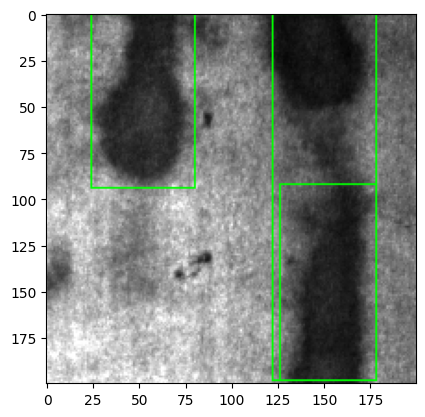

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_102.bmp

0: 640x640 2 Patchess, 72.6ms
Speed: 6.0ms preprocess, 72.6ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 147.69348, 'y': 131.3811, 'width': 37.982468, 'height': 49.954826, 'confidence': 0.85239357, 'class': 'Patches', 'class_id': 1}, {'x': 58.369274, 'y': 97.266556, 'width': 75.66883, 'height': 84.47535, 'confidence': 0.66345286, 'class': 'Patches', 'class_id': 1}]}


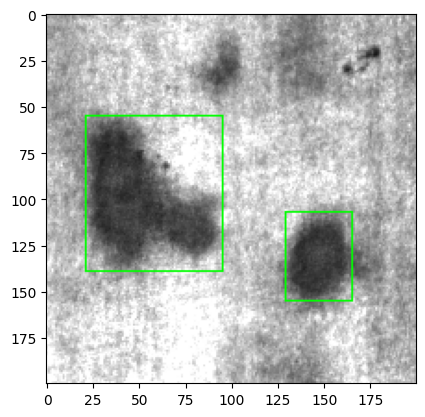

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_103.bmp

0: 640x640 1 Patches, 79.0ms
Speed: 6.8ms preprocess, 79.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 90.6131, 'y': 96.51292, 'width': 61.15212, 'height': 141.61177, 'confidence': 0.82799697, 'class': 'Patches', 'class_id': 1}]}


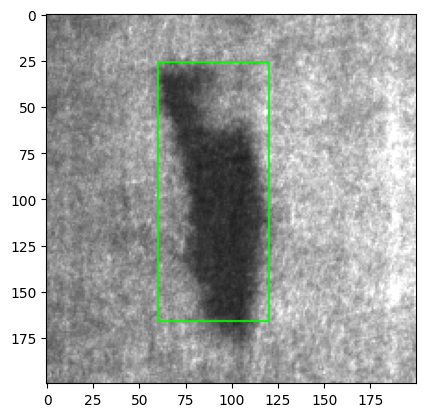

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_104.bmp

0: 640x640 4 Patchess, 91.2ms
Speed: 5.5ms preprocess, 91.2ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 22.710257, 'y': 142.01788, 'width': 44.735622, 'height': 115.539856, 'confidence': 0.44169632, 'class': 'Patches', 'class_id': 1}, {'x': 171.45697, 'y': 165.48932, 'width': 57.08606, 'height': 68.0168, 'confidence': 0.44062746, 'class': 'Patches', 'class_id': 1}, {'x': 146.87105, 'y': 47.007504, 'width': 49.914246, 'height': 94.01501, 'confidence': 0.38462654, 'class': 'Patches', 'class_id': 1}, {'x': 148.58221, 'y': 64.28872, 'width': 51.475754, 'height': 80.20293, 'confidence': 0.25668213, 'class': 'Patches', 'class_id': 1}]}


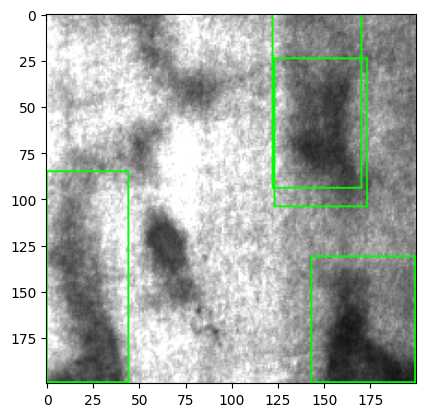

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_105.bmp

0: 640x640 3 Patchess, 72.4ms
Speed: 6.0ms preprocess, 72.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 52.501476, 'y': 47.435825, 'width': 56.4822, 'height': 94.41433, 'confidence': 0.8007257, 'class': 'Patches', 'class_id': 1}, {'x': 150.51802, 'y': 99.66669, 'width': 57.77191, 'height': 198.11887, 'confidence': 0.6374768, 'class': 'Patches', 'class_id': 1}, {'x': 152.23639, 'y': 145.60986, 'width': 53.93297, 'height': 107.53119, 'confidence': 0.34038818, 'class': 'Patches', 'class_id': 1}]}


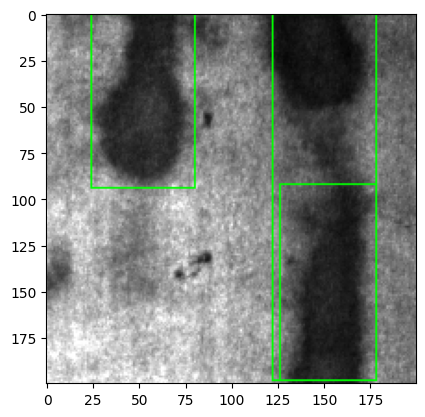

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_106.bmp

0: 640x640 2 Patchess, 93.5ms
Speed: 7.0ms preprocess, 93.5ms inference, 38.6ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 94.11776, 'y': 106.89533, 'width': 38.711014, 'height': 82.15416, 'confidence': 0.6995816, 'class': 'Patches', 'class_id': 1}, {'x': 93.4728, 'y': 90.82941, 'width': 37.0121, 'height': 112.84918, 'confidence': 0.49714747, 'class': 'Patches', 'class_id': 1}]}


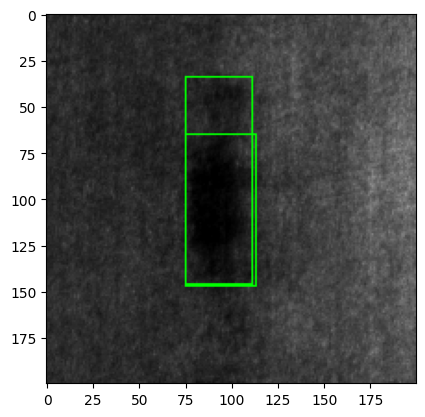

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_107.bmp

0: 640x640 1 Patches, 111.9ms
Speed: 7.0ms preprocess, 111.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 123.017456, 'y': 58.232376, 'width': 56.61695, 'height': 115.678925, 'confidence': 0.6696399, 'class': 'Patches', 'class_id': 1}]}


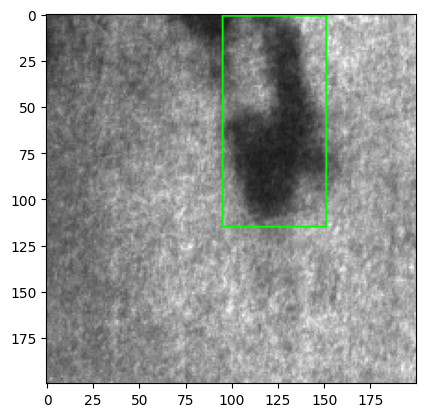

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_108.bmp

0: 640x640 3 Patchess, 88.4ms
Speed: 10.5ms preprocess, 88.4ms inference, 6.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 37.972015, 'y': 65.86479, 'width': 64.12189, 'height': 131.05472, 'confidence': 0.839253, 'class': 'Patches', 'class_id': 1}, {'x': 124.81463, 'y': 60.802647, 'width': 92.25789, 'height': 120.92889, 'confidence': 0.8120184, 'class': 'Patches', 'class_id': 1}, {'x': 169.12071, 'y': 159.83752, 'width': 50.416077, 'height': 67.83641, 'confidence': 0.59264266, 'class': 'Patches', 'class_id': 1}]}


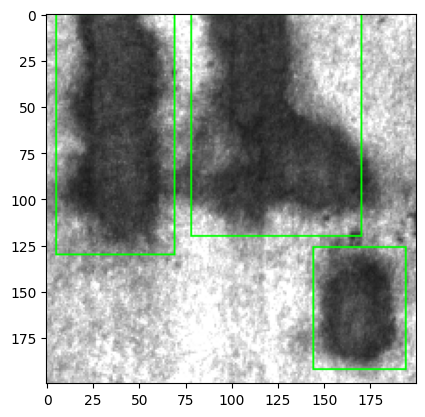

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Patches\Pa_109.bmp

0: 640x640 2 Patchess, 77.3ms
Speed: 8.5ms preprocess, 77.3ms inference, 7.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 101.90487, 'y': 96.11995, 'width': 64.0276, 'height': 137.80716, 'confidence': 0.8477107, 'class': 'Patches', 'class_id': 1}, {'x': 186.22937, 'y': 138.49292, 'width': 27.320602, 'height': 44.23285, 'confidence': 0.58754957, 'class': 'Patches', 'class_id': 1}]}


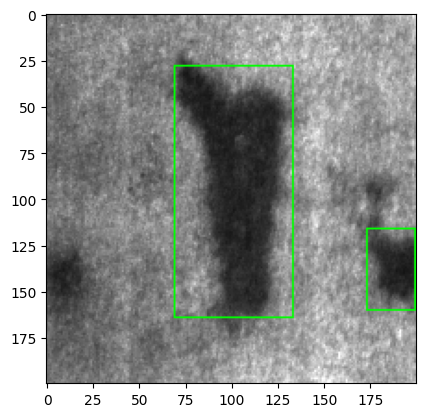

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_1.bmp

0: 640x640 5 Inclusions, 88.8ms
Speed: 9.7ms preprocess, 88.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 130.73427, 'y': 93.829346, 'width': 23.609467, 'height': 39.49591, 'confidence': 0.8621823, 'class': 'Inclusion', 'class_id': 0}, {'x': 127.24933, 'y': 131.41669, 'width': 20.09916, 'height': 34.009933, 'confidence': 0.7604775, 'class': 'Inclusion', 'class_id': 0}, {'x': 124.04137, 'y': 177.40344, 'width': 12.536804, 'height': 45.177917, 'confidence': 0.66737413, 'class': 'Inclusion', 'class_id': 0}, {'x': 42.36979, 'y': 20.647064, 'width': 12.608677, 'height': 26.15828, 'confidence': 0.6572208, 'class': 'Inclusion', 'class_id': 0}, {'x': 126.65981, 'y': 50.308853, 'width': 13.812332, 'height': 27.195347, 'confidence': 0.5300686, 'class': 'Inclusion', 'class_id': 0}]}


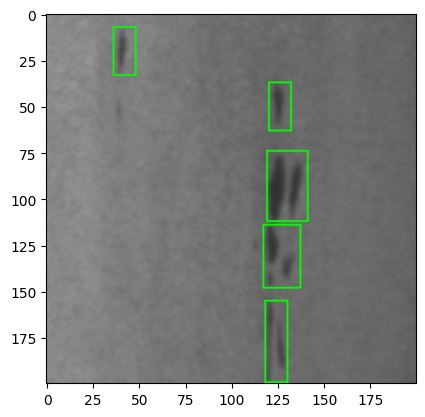

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_10.bmp

0: 640x640 4 Inclusions, 74.7ms
Speed: 3.5ms preprocess, 74.7ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 69.60663, 'y': 69.02446, 'width': 22.023003, 'height': 37.097416, 'confidence': 0.8615171, 'class': 'Inclusion', 'class_id': 0}, {'x': 156.94196, 'y': 143.45956, 'width': 14.108871, 'height': 28.356369, 'confidence': 0.7378614, 'class': 'Inclusion', 'class_id': 0}, {'x': 71.242836, 'y': 33.659042, 'width': 18.700611, 'height': 33.714813, 'confidence': 0.6767314, 'class': 'Inclusion', 'class_id': 0}, {'x': 72.65967, 'y': 115.364365, 'width': 11.116844, 'height': 27.318153, 'confidence': 0.63298327, 'class': 'Inclusion', 'class_id': 0}]}


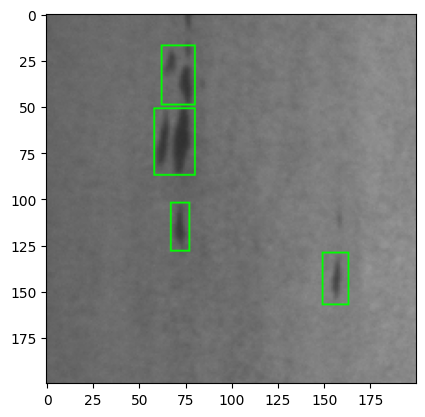

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_100.bmp

0: 640x640 3 Inclusions, 89.2ms
Speed: 4.3ms preprocess, 89.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 80.05887, 'y': 91.51816, 'width': 43.204098, 'height': 182.50317, 'confidence': 0.47884664, 'class': 'Inclusion', 'class_id': 0}, {'x': 86.145836, 'y': 100.09474, 'width': 57.81071, 'height': 199.81052, 'confidence': 0.44612092, 'class': 'Inclusion', 'class_id': 0}, {'x': 165.49261, 'y': 187.4134, 'width': 21.741806, 'height': 24.73764, 'confidence': 0.26530716, 'class': 'Inclusion', 'class_id': 0}]}


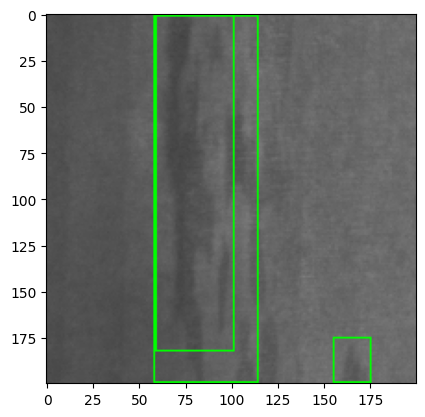

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_101.bmp

0: 640x640 1 Inclusion, 121.7ms
Speed: 14.0ms preprocess, 121.7ms inference, 6.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 135.29398, 'y': 99.68175, 'width': 52.13347, 'height': 199.3635, 'confidence': 0.5665355, 'class': 'Inclusion', 'class_id': 0}]}


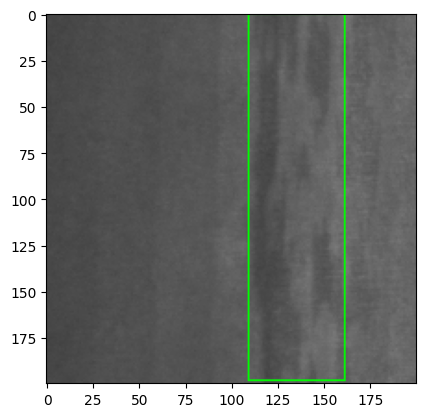

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_102.bmp

0: 640x640 1 Inclusion, 90.2ms
Speed: 5.5ms preprocess, 90.2ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 55.254, 'y': 99.55838, 'width': 51.83828, 'height': 198.66425, 'confidence': 0.5463781, 'class': 'Inclusion', 'class_id': 0}]}


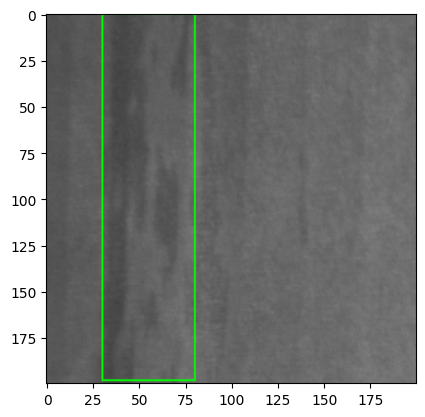

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_103.bmp

0: 640x640 3 Inclusions, 82.1ms
Speed: 4.3ms preprocess, 82.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 162.50119, 'y': 79.09982, 'width': 41.65425, 'height': 157.50583, 'confidence': 0.3995059, 'class': 'Inclusion', 'class_id': 0}, {'x': 154.56535, 'y': 99.39094, 'width': 66.98898, 'height': 198.19429, 'confidence': 0.35256478, 'class': 'Inclusion', 'class_id': 0}, {'x': 171.5792, 'y': 68.57512, 'width': 28.743668, 'height': 135.86609, 'confidence': 0.30529317, 'class': 'Inclusion', 'class_id': 0}]}


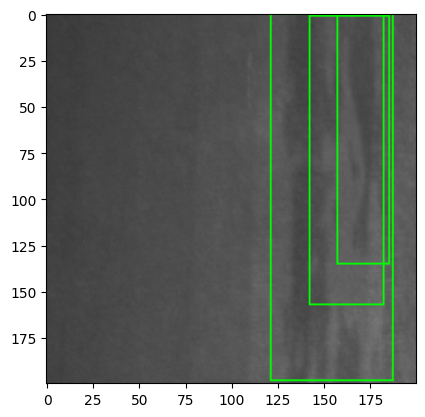

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_104.bmp

0: 640x640 1 Inclusion, 93.7ms
Speed: 13.1ms preprocess, 93.7ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 43.35679, 'y': 99.45547, 'width': 51.222546, 'height': 197.95525, 'confidence': 0.47634652, 'class': 'Inclusion', 'class_id': 0}]}


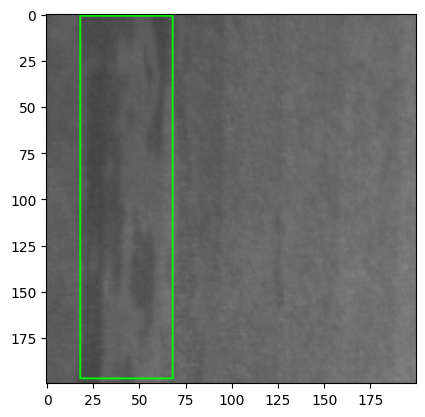

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_105.bmp

0: 640x640 2 Inclusions, 99.1ms
Speed: 6.9ms preprocess, 99.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 94.74987, 'y': 100.03987, 'width': 69.555466, 'height': 198.8378, 'confidence': 0.5559668, 'class': 'Inclusion', 'class_id': 0}, {'x': 154.94626, 'y': 76.053604, 'width': 17.047195, 'height': 47.16024, 'confidence': 0.36033812, 'class': 'Inclusion', 'class_id': 0}]}


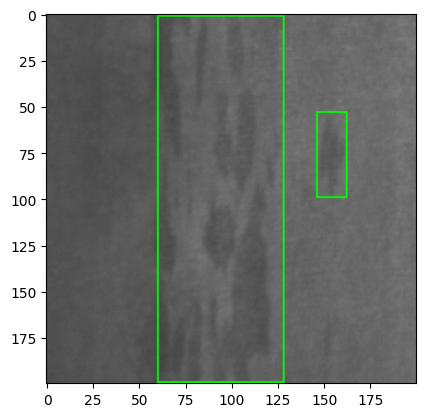

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_106.bmp

0: 640x640 1 Inclusion, 72.2ms
Speed: 5.5ms preprocess, 72.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 105.64544, 'y': 102.2043, 'width': 67.140274, 'height': 193.38394, 'confidence': 0.6094043, 'class': 'Inclusion', 'class_id': 0}]}


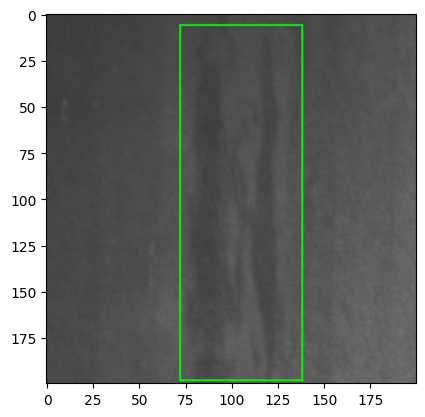

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_107.bmp

0: 640x640 2 Inclusions, 1 Scratches, 102.0ms
Speed: 6.5ms preprocess, 102.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 42.93201, 'y': 129.46043, 'width': 13.574905, 'height': 71.31714, 'confidence': 0.7049351, 'class': 'Inclusion', 'class_id': 0}, {'x': 49.47325, 'y': 47.904175, 'width': 7.8516083, 'height': 50.068848, 'confidence': 0.3605871, 'class': 'Scratches', 'class_id': 2}, {'x': 193.77719, 'y': 16.863676, 'width': 12.441483, 'height': 33.62163, 'confidence': 0.30296835, 'class': 'Inclusion', 'class_id': 0}]}


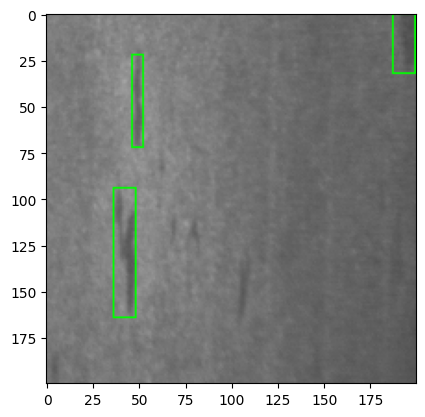

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_108.bmp

0: 640x640 1 Inclusion, 73.4ms
Speed: 5.5ms preprocess, 73.4ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 158.40462, 'y': 99.83359, 'width': 30.67398, 'height': 199.66718, 'confidence': 0.3501555, 'class': 'Inclusion', 'class_id': 0}]}


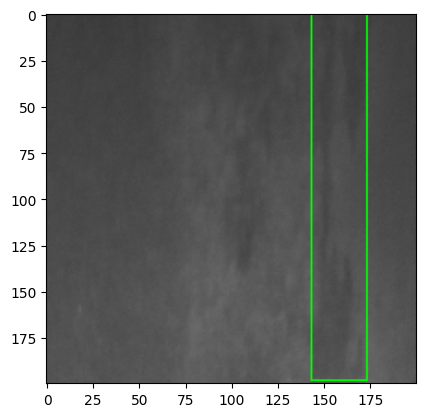

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Inclusion\In_109.bmp

0: 640x640 4 Inclusions, 76.4ms
Speed: 4.5ms preprocess, 76.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 151.8577, 'y': 94.72299, 'width': 45.1436, 'height': 189.44598, 'confidence': 0.62737906, 'class': 'Inclusion', 'class_id': 0}, {'x': 52.480392, 'y': 99.10175, 'width': 21.80149, 'height': 197.43309, 'confidence': 0.3509469, 'class': 'Inclusion', 'class_id': 0}, {'x': 59.58843, 'y': 43.570137, 'width': 30.182533, 'height': 87.11571, 'confidence': 0.29197428, 'class': 'Inclusion', 'class_id': 0}, {'x': 59.052277, 'y': 97.38182, 'width': 33.83629, 'height': 194.06723, 'confidence': 0.2899056, 'class': 'Inclusion', 'class_id': 0}]}


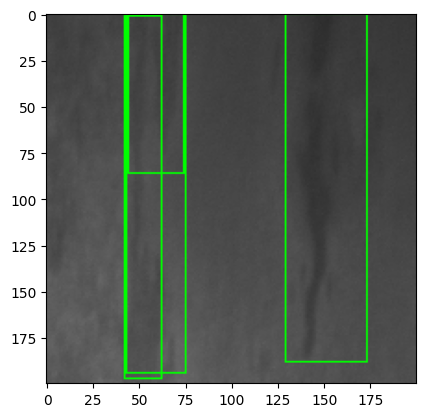

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_1.bmp

0: 640x640 4 Scratchess, 78.1ms
Speed: 4.5ms preprocess, 78.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 34.794285, 'y': 92.6046, 'width': 11.540443, 'height': 161.43628, 'confidence': 0.60083693, 'class': 'Scratches', 'class_id': 2}, {'x': 34.367607, 'y': 126.536316, 'width': 11.896679, 'height': 85.363655, 'confidence': 0.45712632, 'class': 'Scratches', 'class_id': 2}, {'x': 12.657618, 'y': 193.05838, 'width': 10.366124, 'height': 13.391266, 'confidence': 0.38197988, 'class': 'Scratches', 'class_id': 2}, {'x': 35.25186, 'y': 72.54174, 'width': 9.817619, 'height': 117.92906, 'confidence': 0.30309275, 'class': 'Scratches', 'class_id': 2}]}


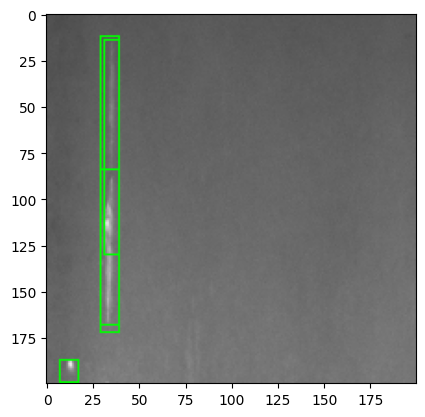

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_10.bmp

0: 640x640 13 Scratchess, 73.4ms
Speed: 5.0ms preprocess, 73.4ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 148.89713, 'y': 76.861786, 'width': 8.107681, 'height': 74.033264, 'confidence': 0.5730857, 'class': 'Scratches', 'class_id': 2}, {'x': 98.31288, 'y': 60.31316, 'width': 47.39557, 'height': 120.42849, 'confidence': 0.50318307, 'class': 'Scratches', 'class_id': 2}, {'x': 147.85736, 'y': 77.385155, 'width': 11.844101, 'height': 75.11409, 'confidence': 0.49836338, 'class': 'Scratches', 'class_id': 2}, {'x': 99.72337, 'y': 109.67991, 'width': 13.042259, 'height': 60.31459, 'confidence': 0.43409815, 'class': 'Scratches', 'class_id': 2}, {'x': 10.424975, 'y': 162.24617, 'width': 6.9474697, 'height': 13.493439, 'confidence': 0.43202803, 'class': 'Scratches', 'class_id': 2}, {'x': 147.27673, 'y': 156.90887, 'width': 12.518417, 'height': 84.43555, 'confidence': 0.4179

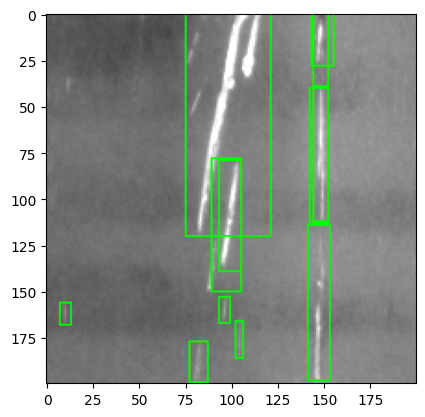

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_100.bmp

0: 640x640 1 Scratches, 73.9ms
Speed: 5.2ms preprocess, 73.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 99.74431, 'y': 109.49928, 'width': 199.48862, 'height': 27.047424, 'confidence': 0.6475232, 'class': 'Scratches', 'class_id': 2}]}


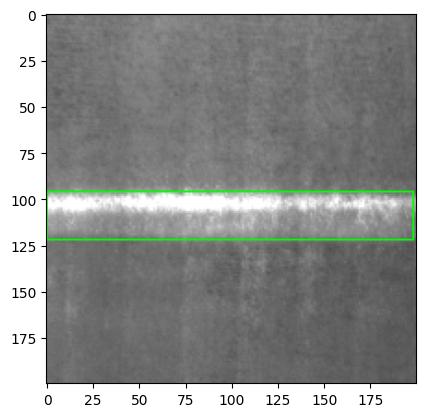

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_101.bmp

0: 640x640 1 Scratches, 114.8ms
Speed: 5.5ms preprocess, 114.8ms inference, 54.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 100.596886, 'y': 88.951004, 'width': 197.95308, 'height': 37.267586, 'confidence': 0.53993684, 'class': 'Scratches', 'class_id': 2}]}


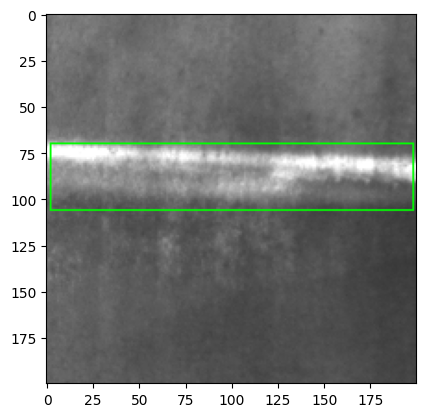

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_102.bmp

0: 640x640 1 Scratches, 80.2ms
Speed: 4.6ms preprocess, 80.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 99.819145, 'y': 77.72058, 'width': 198.2516, 'height': 31.872078, 'confidence': 0.69634604, 'class': 'Scratches', 'class_id': 2}]}


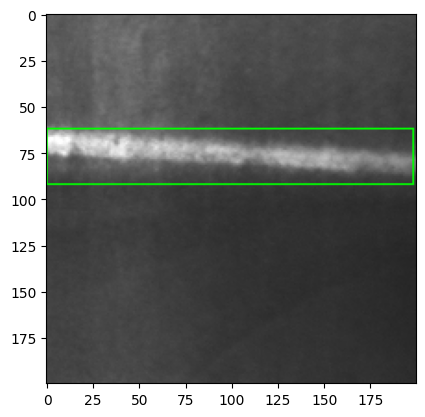

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_103.bmp

0: 640x640 1 Scratches, 79.7ms
Speed: 7.0ms preprocess, 79.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 99.82401, 'y': 100.4221, 'width': 199.11415, 'height': 16.258926, 'confidence': 0.69129926, 'class': 'Scratches', 'class_id': 2}]}


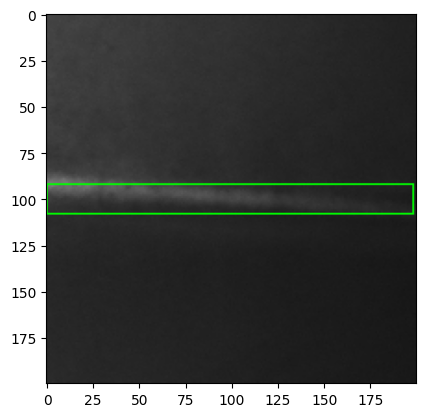

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_104.bmp

0: 640x640 (no detections), 79.1ms
Speed: 4.0ms preprocess, 79.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': []}


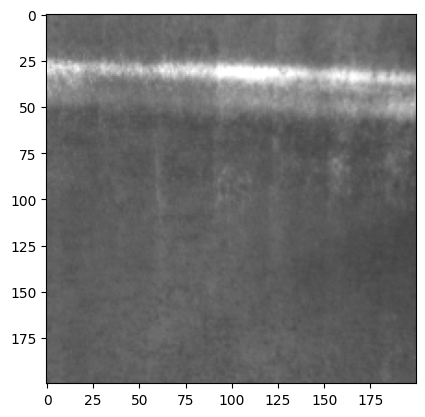

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_105.bmp

0: 640x640 1 Scratches, 138.1ms
Speed: 6.0ms preprocess, 138.1ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 99.18471, 'y': 46.910614, 'width': 198.36942, 'height': 30.019035, 'confidence': 0.6627796, 'class': 'Scratches', 'class_id': 2}]}


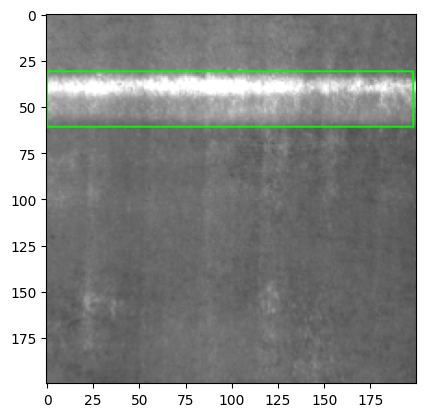

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_106.bmp

0: 640x640 1 Scratches, 78.0ms
Speed: 5.0ms preprocess, 78.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 99.737816, 'y': 39.874886, 'width': 199.47563, 'height': 17.732615, 'confidence': 0.4339036, 'class': 'Scratches', 'class_id': 2}]}


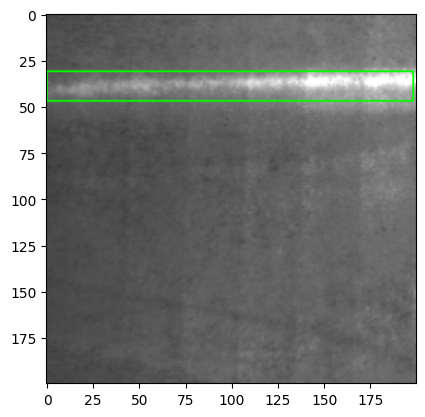

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_107.bmp

0: 640x640 1 Scratches, 78.3ms
Speed: 7.0ms preprocess, 78.3ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 99.44216, 'y': 40.734856, 'width': 198.42134, 'height': 32.903347, 'confidence': 0.70761925, 'class': 'Scratches', 'class_id': 2}]}


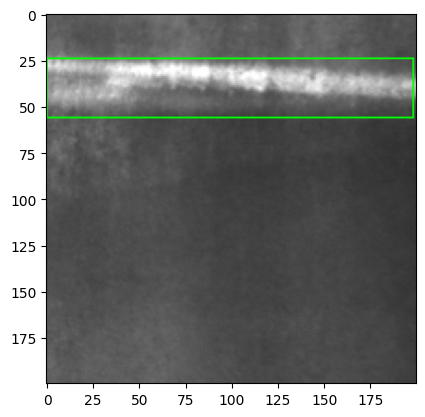

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_108.bmp

0: 640x640 4 Inclusions, 1 Scratches, 79.6ms
Speed: 4.5ms preprocess, 79.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 63.257618, 'y': 99.75145, 'width': 36.851692, 'height': 199.5029, 'confidence': 0.7440503, 'class': 'Scratches', 'class_id': 2}, {'x': 142.50977, 'y': 164.27222, 'width': 15.943726, 'height': 71.27338, 'confidence': 0.68980336, 'class': 'Inclusion', 'class_id': 0}, {'x': 163.78508, 'y': 174.08676, 'width': 8.824432, 'height': 23.727112, 'confidence': 0.55930144, 'class': 'Inclusion', 'class_id': 0}, {'x': 13.573631, 'y': 162.53967, 'width': 8.384854, 'height': 38.2361, 'confidence': 0.46785477, 'class': 'Inclusion', 'class_id': 0}, {'x': 164.06593, 'y': 147.27429, 'width': 10.756531, 'height': 25.646896, 'confidence': 0.38556287, 'class': 'Inclusion', 'class_id': 0}]}


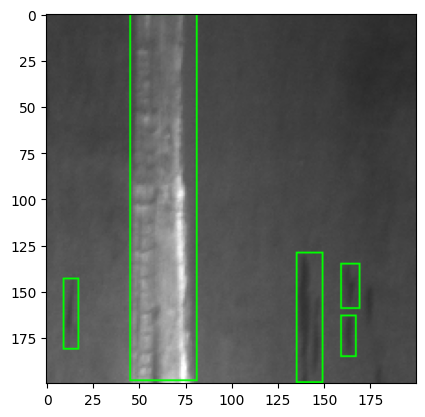

D:\Prakash\Downloads\NEU Metal Surface Defects Data\test\Scratches\Sc_109.bmp

0: 640x640 8 Inclusions, 1 Scratches, 97.8ms
Speed: 5.0ms preprocess, 97.8ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)
{'predictions': [{'x': 139.42146, 'y': 99.50127, 'width': 38.559143, 'height': 199.00253, 'confidence': 0.7617969, 'class': 'Scratches', 'class_id': 2}, {'x': 44.00245, 'y': 165.66205, 'width': 10.012455, 'height': 27.560959, 'confidence': 0.53990823, 'class': 'Inclusion', 'class_id': 0}, {'x': 89.20712, 'y': 163.85269, 'width': 8.406677, 'height': 34.667328, 'confidence': 0.48120037, 'class': 'Inclusion', 'class_id': 0}, {'x': 31.279467, 'y': 142.02417, 'width': 8.318287, 'height': 73.292465, 'confidence': 0.48075768, 'class': 'Inclusion', 'class_id': 0}, {'x': 16.701023, 'y': 195.50027, 'width': 28.649391, 'height': 8.606995, 'confidence': 0.3840879, 'class': 'Inclusion', 'class_id': 0}, {'x': 76.067535, 'y': 43.330994, 'width': 8.433907, 'height': 34.043724, 'confid

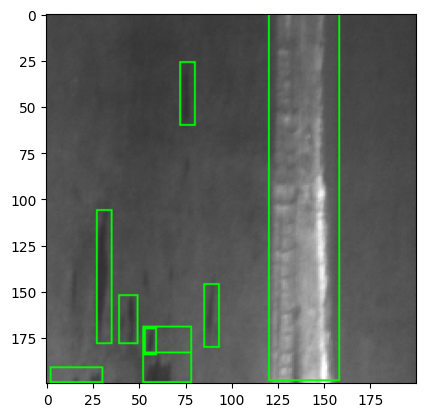

In [32]:
model_250 = YOLO(r'D:\Prakash\Github\Object-Detection-And-Diameter-Measurement-Using-YoloV8\Object-Detection-And-Diameter-Measurement-Using-YoloV8\defect_detections\runs\detect\train\weights\best.pt')

import os
# paths = []
p = r'D:\Prakash\Downloads\NEU Metal Surface Defects Data\test'
for i in ['Patches', 'Inclusion', 'Scratches']:
    path_ = os.path.join(p, i)
    for j in os.listdir(path_):
        path = os.path.join(path_, j)
        print(path)
        pred(path)